In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/plantdisease/PlantVillage/Pepper__bell___Bacterial_spot/0f72db9c-d635-4415-9781-68937328aed2___NREC_B.Spot 9188.JPG
/kaggle/input/plantdisease/PlantVillage/Pepper__bell___Bacterial_spot/1b8d3e98-43d9-441d-93ef-a359e6e9ddc2___NREC_B.Spot 9052.JPG
/kaggle/input/plantdisease/PlantVillage/Pepper__bell___Bacterial_spot/b6d35d21-4812-4e32-ab9a-b6ddda8cbb79___JR_B.Spot 8972.JPG
/kaggle/input/plantdisease/PlantVillage/Pepper__bell___Bacterial_spot/e4e7e5a2-5aa1-4378-833d-9142358c7c9b___JR_B.Spot 9092.JPG
/kaggle/input/plantdisease/PlantVillage/Pepper__bell___Bacterial_spot/8b50f2db-cbf2-4758-bea6-a011f0cc1497___JR_B.Spot 3235.JPG
/kaggle/input/plantdisease/PlantVillage/Pepper__bell___Bacterial_spot/729b55d7-2a99-4861-910d-3b4e2bbce13a___JR_B.Spot 9036.JPG
/kaggle/input/plantdisease/PlantVillage/Pepper__bell___Bacterial_spot/4614ed01-e120-4ae9-8f13-028fa8297873___JR_B.Spot 8985.JPG
/kaggle/input/plantdisease/PlantVillage/Pepper__bell___Bacterial_spot/b143a281-5395-4a2a-8308-f6b23a

In [2]:
 %pip install torchsummary

ERROR: Could not find a version that satisfies the requirement torchsummary (from versions: none)
ERROR: No matching distribution found for torchsummary
Note: you may need to restart the kernel to use updated packages.


In [3]:
import os                       # for working with files
import numpy as np              # for numerical computationss
import pandas as pd             # for working with dataframes
import torch                    # Pytorch module 
import matplotlib.pyplot as plt # for plotting informations on graph and images using tensors
import torch.nn as nn           # for creating  neural networks
from torch.utils.data import DataLoader # for dataloaders 
from PIL import Image           # for checking images
import torch.nn.functional as F # for functions for calculating loss
import torchvision.transforms as transforms   # for transforming images into tensors 
from torchvision.utils import make_grid       # for data checking
from torchvision.datasets import ImageFolder  # for working with classes and images


%matplotlib inline

In [4]:
dataDir = '/kaggle/input/plantdisease/PlantVillage'
selectedClasses = ['Pepper__bell___Bacterial_spot',
                   'Pepper__bell___healthy',
                   'Potato___Early_blight',
                   'Potato___Late_blight',
                   'Tomato_Early_blight',
                   'Tomato_Leaf_Mold']          

In [5]:
imgPaths = []
labels = []
for className in os.listdir(dataDir):
    if className in selectedClasses :                  # Select you classes above
        classPath = os.path.join(dataDir,className)
        for img in os.listdir(classPath):
            imgPath = os.path.join(classPath,img)
            imgPaths.append(imgPath)
            labels.append(className)
            
# Convert the 2 lists to dataframe to easy use 
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True)            # Shuffle

df

,imgPath,label
0,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
1,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
2,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Early_blight
3,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Late_blight
4,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___healthy
...,...,...
6422,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Late_blight
6423,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato_Early_blight
6424,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Early_blight
6425,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___healthy


In [6]:
df['label'] = df['label'].replace({'Pepper__bell___Bacterial_spot':0 ,
                                   'Pepper__bell___healthy':1 ,
                                   'Potato___Early_blight':2 ,
                                   'Potato___Late_blight':3 ,
                                   'Tomato_Early_blight':4 ,
                                   'Tomato_Leaf_Mold':5}).astype(int)

/tmp/ipykernel_30/300140912.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['label'] = df['label'].replace({'Pepper__bell___Bacterial_spot':0 ,


In [7]:
df

,imgPath,label
0,/kaggle/input/plantdisease/PlantVillage/Pepper...,0
1,/kaggle/input/plantdisease/PlantVillage/Pepper...,0
2,/kaggle/input/plantdisease/PlantVillage/Potato...,2
3,/kaggle/input/plantdisease/PlantVillage/Potato...,3
4,/kaggle/input/plantdisease/PlantVillage/Pepper...,1
...,...,...
6422,/kaggle/input/plantdisease/PlantVillage/Potato...,3
6423,/kaggle/input/plantdisease/PlantVillage/Tomato...,4
6424,/kaggle/input/plantdisease/PlantVillage/Potato...,2
6425,/kaggle/input/plantdisease/PlantVillage/Pepper...,1


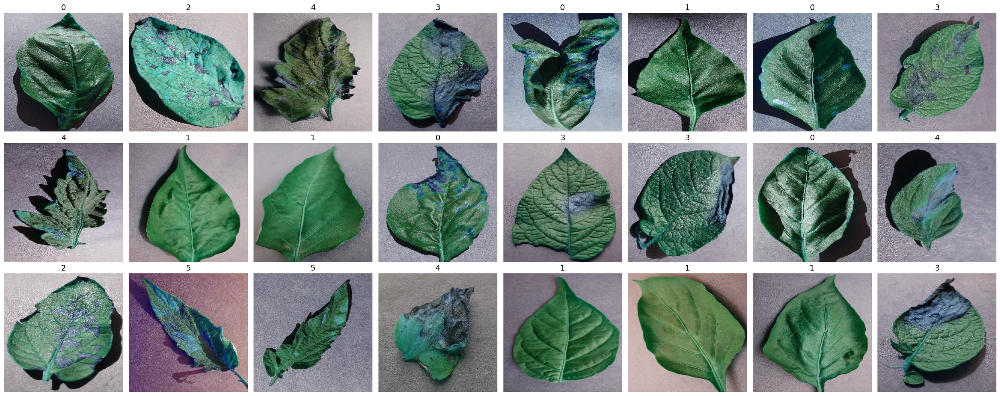

In [8]:
import random
import cv2
fig, axs = plt.subplots(3, 8, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label , fontsize=14)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

In [9]:
from tqdm import tqdm

IMG_SIZE = (150,150)   # to free some resources and reduce the execution time
imgs = []
for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    imgs.append(img)

100%|██████████| 6427/6427 [01:02<00:00, 102.10it/s]


In [10]:
images = np.array(imgs)
labels = np.array(df['label'])

len(images) , len(labels)

(6427, 6427)

Normalisation of image

In [11]:
images = images / 255.0       

In [12]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (5141, 150, 150, 3)
Shape of X_test : (1286, 150, 150, 3)
Shape of y_train : (5141,)
Shape of y_test : (1286,)


In [13]:
import tensorflow as tf
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.applications import VGG16
from keras.models import Sequential

with tf.device('/GPU:0'):
    kerasModel = Sequential([
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID' ,input_shape=(150,150,3)), # padding ='SAME' for using padding
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        Flatten(),

        Dense(128,activation='relu'),
        Dense(6 ,activation='softmax')
    ])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [14]:
kerasModel.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [15]:
history = kerasModel.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=50,
                         batch_size=50, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 91s 1s/step - accuracy: 0.5730 - loss: 1.1726 - val_accuracy: 0.1487 - val_loss: 6.4104
Epoch 2/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - accuracy: 0.8027 - loss: 0.5714 - val_accuracy: 0.1487 - val_loss: 9.4956
Epoch 3/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - accuracy: 0.8344 - loss: 0.4470 - val_accuracy: 0.1487 - val_loss: 10.2424
Epoch 4/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.8576 - loss: 0.3950 - val_accuracy: 0.1487 - val_loss: 9.2478
Epoch 5/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - accuracy: 0.8942 - loss: 0.2963 - val_accuracy: 0.1516 - val_loss: 7.6511
Epoch 6/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 141s 994ms/step - accuracy: 0.9027 - loss: 0.2766 - val_accuracy: 0.2789 - val_loss: 2.9026
Epoch 7/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 143s 1s/step - accuracy: 0.9168 - loss: 0.2556 - val_accuracy: 0.5121 - val_loss: 1.3885
Epoch 8/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 83s 999ms/step - accuracy: 0.9406 - loss: 0.1829 - val_accuracy: 0.7425 -

In [16]:
y_pred = kerasModel.predict(X_test)

41/41 ━━━━━━━━━━━━━━━━━━━━ 13s 307ms/step


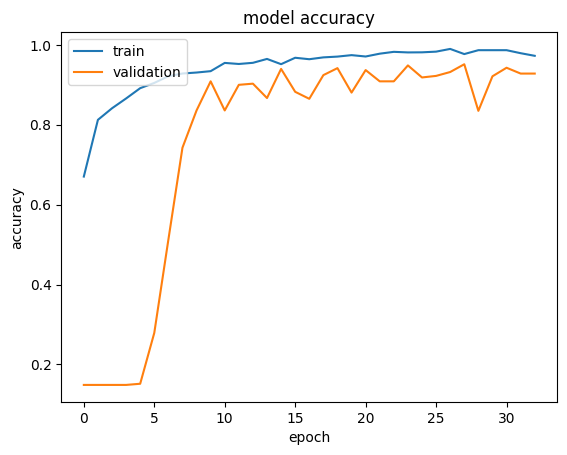

In [17]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [18]:
y_test[:10]

array([3, 5, 1, 4, 3, 2, 1, 1, 1, 4])

In [19]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[3, 5, 1, 4, 3, 2, 1, 1, 1, 5]

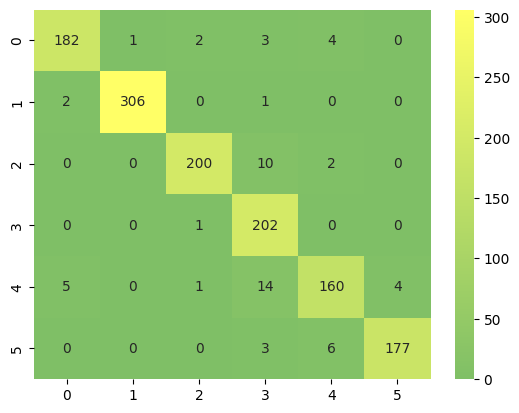

In [20]:
from sklearn.metrics import confusion_matrix,classification_report
import seaborn as sns
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [21]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.96      0.95      0.96       192
           1       1.00      0.99      0.99       309
           2       0.98      0.94      0.96       212
           3       0.87      1.00      0.93       203
           4       0.93      0.87      0.90       184
           5       0.98      0.95      0.96       186

    accuracy                           0.95      1286
   macro avg       0.95      0.95      0.95      1286
weighted avg       0.96      0.95      0.95      1286



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


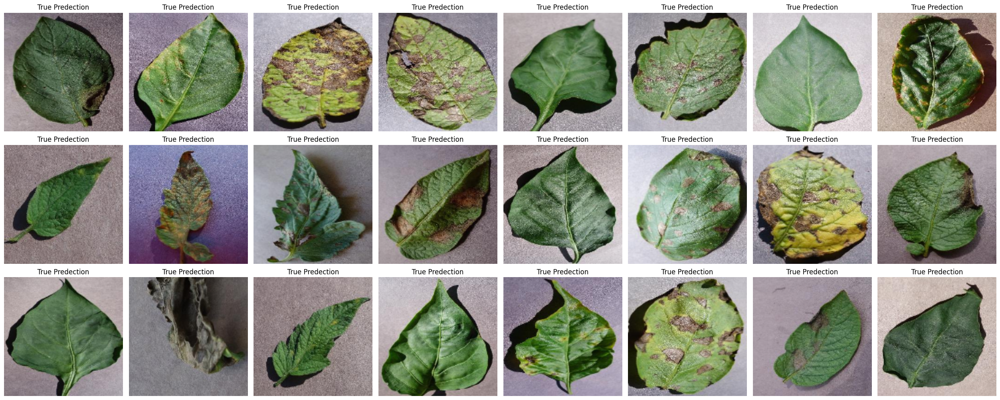

In [22]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(range(len(X_test)))
    img = X_test[index]
    label = y_test[index]
    reshapedImg = img.reshape(1,150,150,3)
    pred = np.argmax(kerasModel.predict(reshapedImg))
    isPredectedTrue = 'True' if (label == pred) else 'False'
    axs[i].imshow(img)
    axs[i].set_title(f'{isPredectedTrue} Predection')
    axs[i].axis('off')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()

In [23]:
import torch
PATH = './plant-disease-model-complete.pth'
torch.save(kerasModel, PATH)

In [24]:
!pip install -q streamlit

ERROR: Could not find a version that satisfies the requirement streamlit (from versions: none)
ERROR: No matching distribution found for streamlit


In [25]:
%%writefile my_app.py

import streamlit as st

Writing my_app.py


In [33]:
%pip install streamlit
import streamlit as st
def main():
    st.write("""# Simple streamlit app""")
    img = st.file_uploader("Upload the image", type='image')
    y=kerasModel.predict(img)
    y = y.replace({0:'Pepper__bell___Bacterial_spot' ,
                                   1:'Pepper__bell___healthy' ,
                                   2 : 'Potato___Early_blight' ,
                                   3 : 'Potato___Late_blight' ,
                                   4 : 'Tomato_Early_blight' ,
                                   5 : 'Tomato_Leaf_Mold'}).astype(int)
    st.write(y)
    

if __name__ == '__main__':
    main()

ERROR: Could not find a version that satisfies the requirement streamlit (from versions: none)
ERROR: No matching distribution found for streamlit
Note: you may need to restart the kernel to use updated packages.


ModuleNotFoundError: No module named 'streamlit'

In [ ]:
!streamlit run ./my_app.py